# Ejercicio 4
4- Realice una registración basada en características, otra con CCN y otra con MI de la imágenes
contenidas en “PAIByB-7”, evaluando los resultados con las métricas de la GUIA I ¿Qué
conclusiones puede sacar al respecto? Comparar los resultados entre sí.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

from registration import Imagen, Registracion

%load_ext autoreload
%autoreload 2

Antes de comenzar, se aclara que se utilizaran las versiones denoiseadas de las imágenes, ya que se obtienen mejores resultados en la registración.

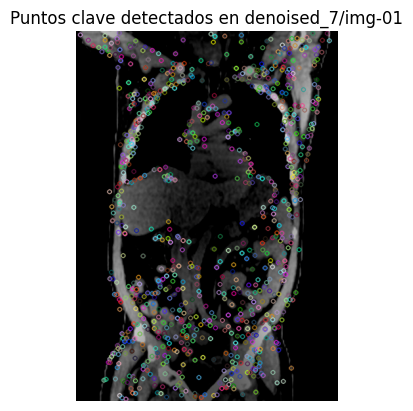

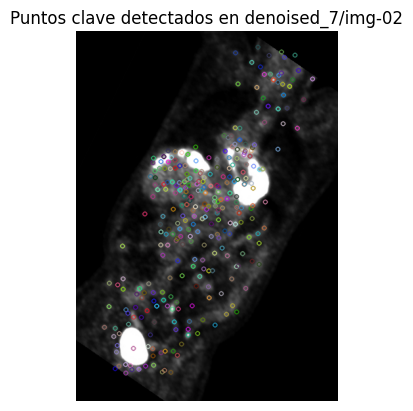

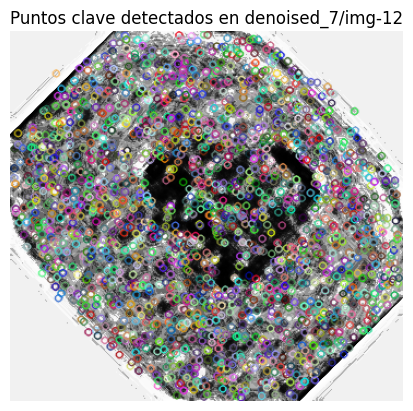

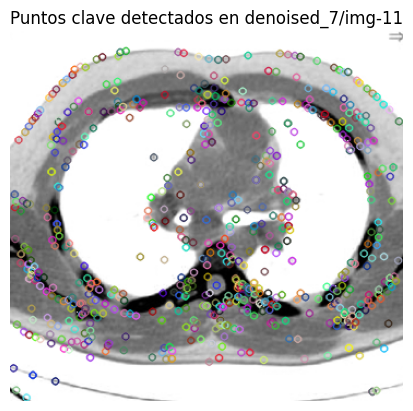

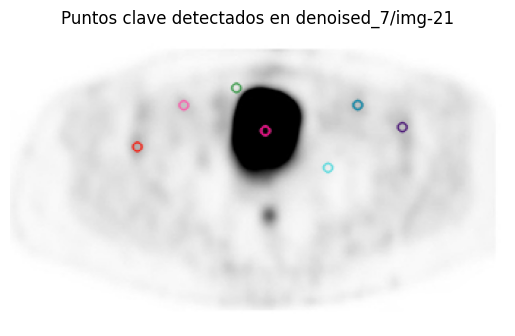

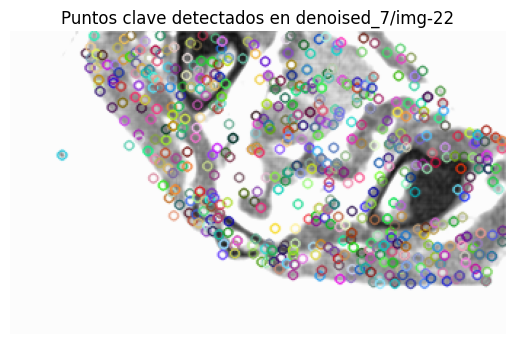

In [2]:
base_dir = 'denoised_7'
reg_pairs = {f"{base_dir}/img-{i}{i%2+1}.tif": f"{base_dir}/img-{i}{(i+1)%2+1}.tif" for i in range(3)}
img_pairs = []

for img1, img2 in reg_pairs.items():
    im1 = Imagen(img1, feature_extractor='sift')
    im1.mostrar_puntos_clave()
    im2 = Imagen(img2, feature_extractor='sift')
    # Invertimos la imagen y recalculamos los puntos clave
    im2.imagen = 255 - im2.imagen
    im2.extraer_puntos_clave()
    im2.mostrar_puntos_clave()
    img_pairs.append((im1, im2))

# Registración basada en características por SIFT

Matches encontrados: 365


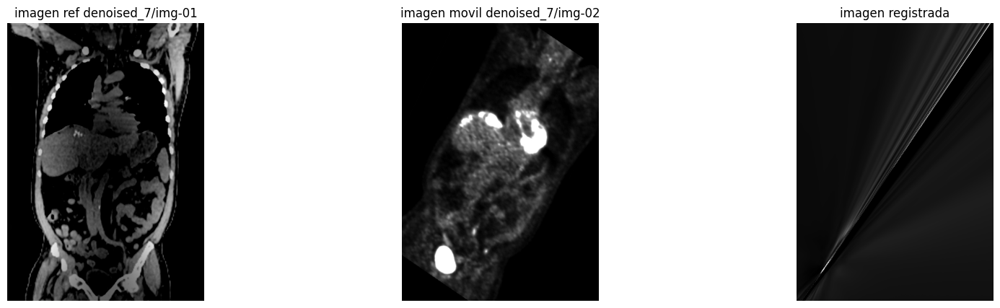

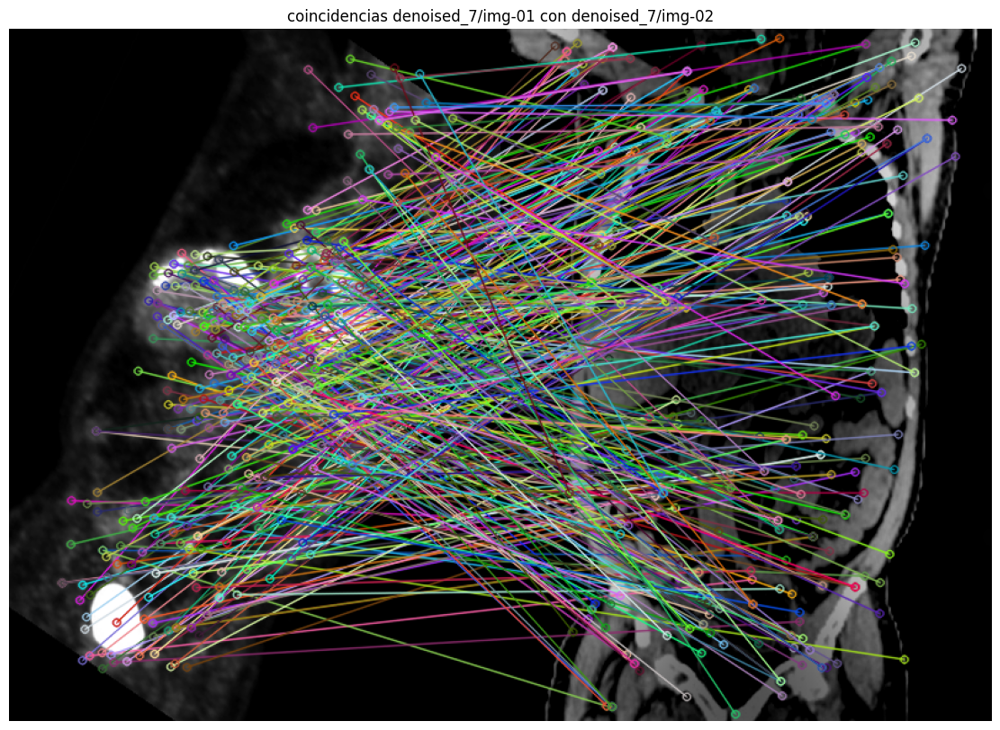

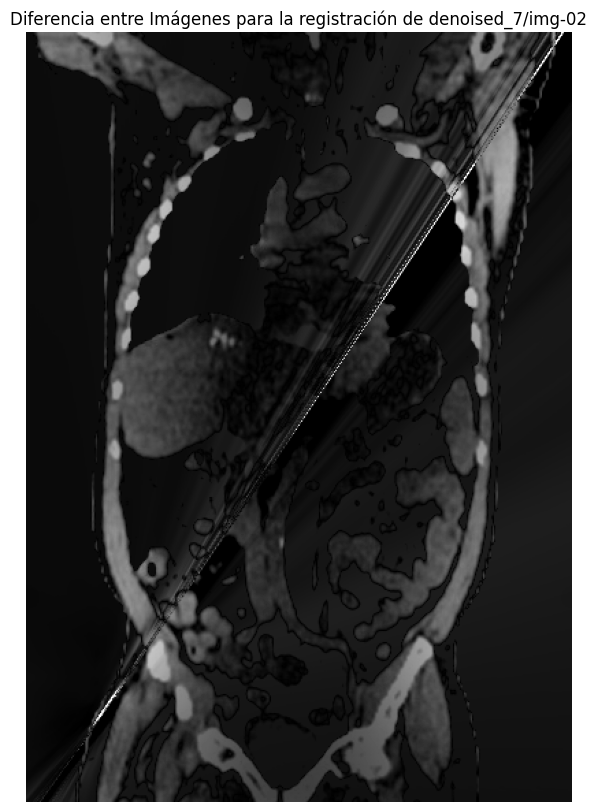

SSIM: 0.1319
MSE: 106.4035
PSNR: 64.1529
SSIM: 0.1319
MSE: 106.4035
PSNR: 64.1529
Matches encontrados: 615


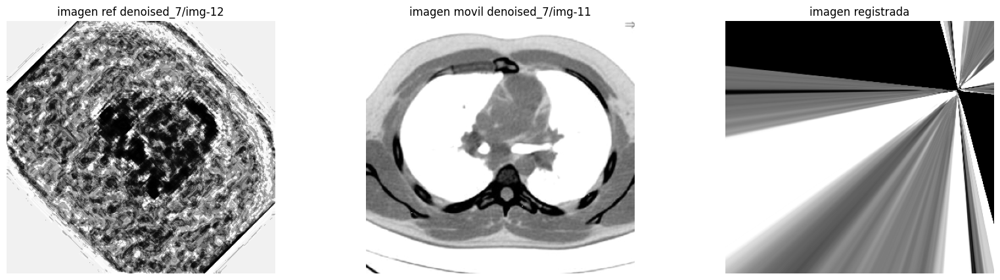

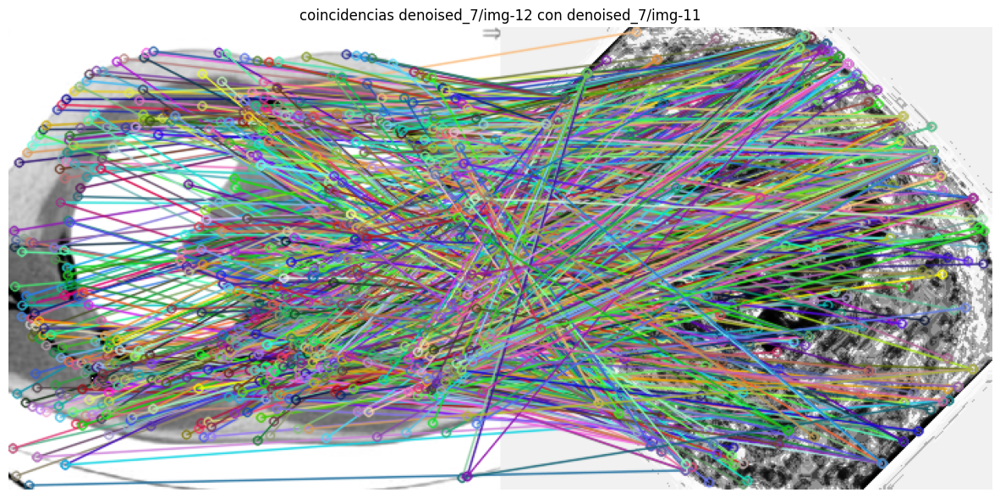

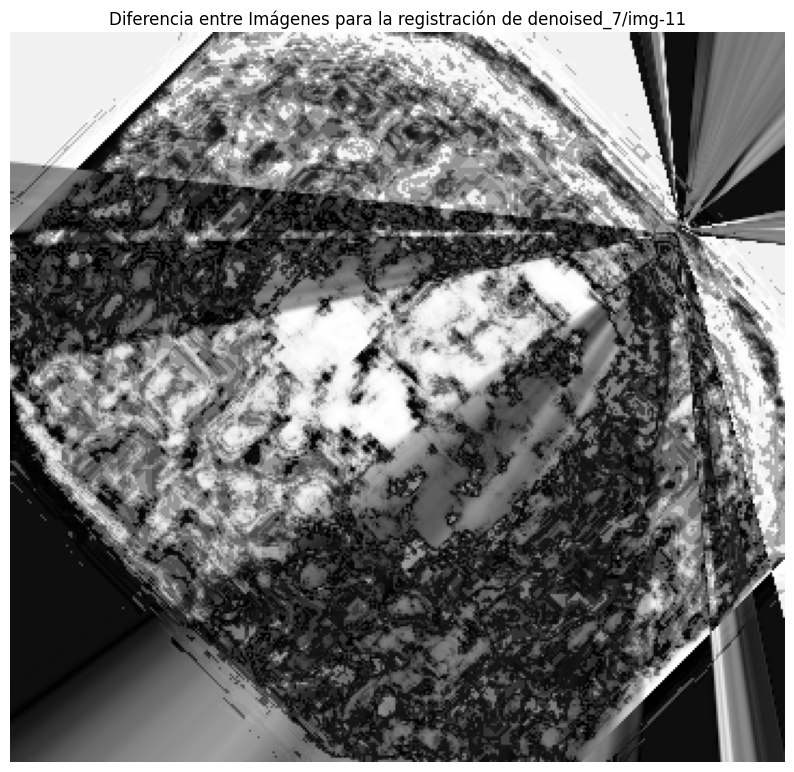

SSIM: 0.0913
MSE: 110.9164
PSNR: 63.7375
SSIM: 0.0913
MSE: 110.9164
PSNR: 63.7375
Matches encontrados: 584


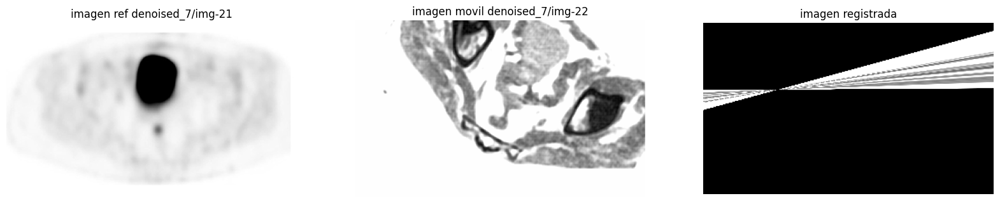

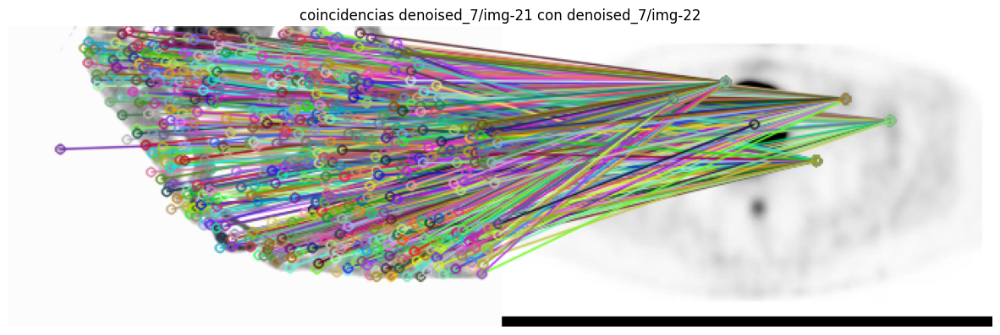

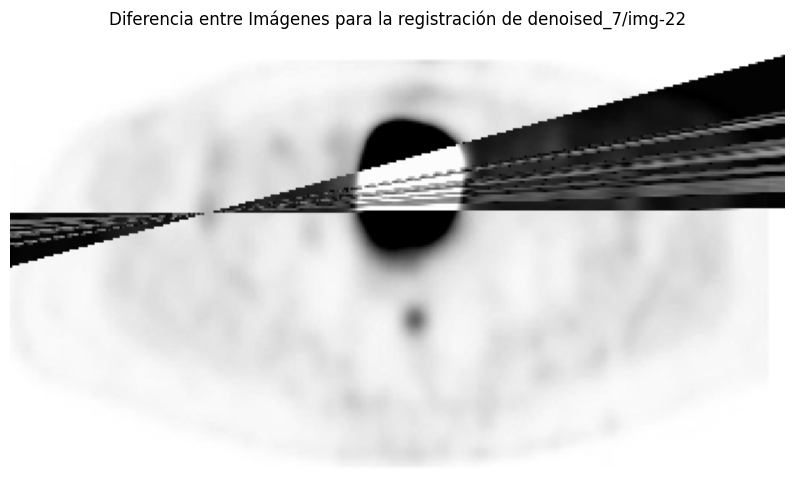

SSIM: 0.0282
MSE: 79.0986
PSNR: 67.1183
SSIM: 0.0282
MSE: 79.0986
PSNR: 67.1183


In [3]:
# Registración basada en características
for im1, im2 in img_pairs:
    reg = Registracion(im1, im2, modo='features', min_match_count=4, lowe_threshold=1, ransac_thres=5)
    reg.ejecutar_registracion(plot=True)
    reg.calcular_metricas()

## Registración basada en CCN


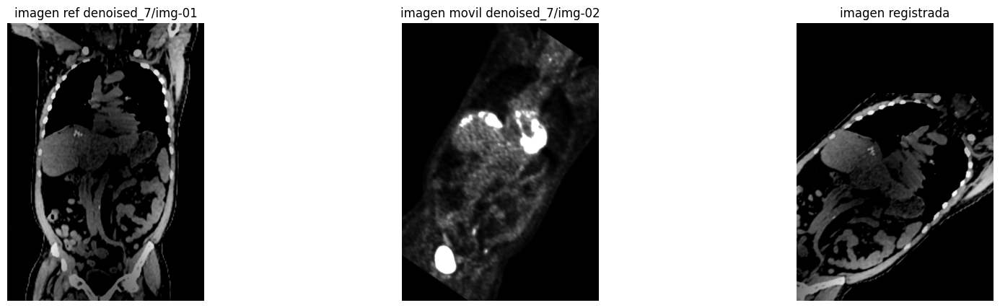

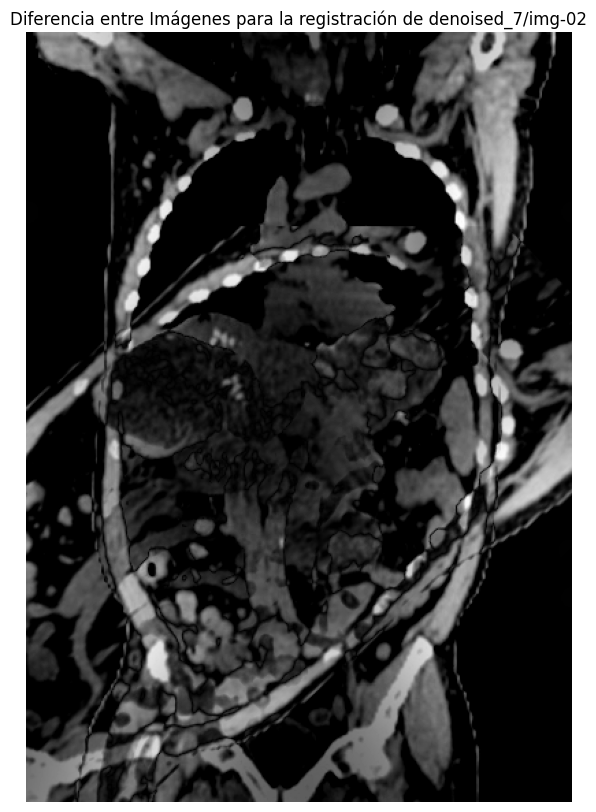

SSIM: 0.3160
MSE: 62.3046
PSNR: 69.5049


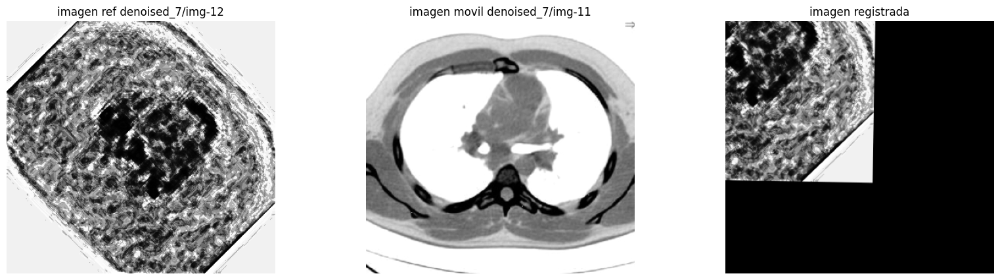

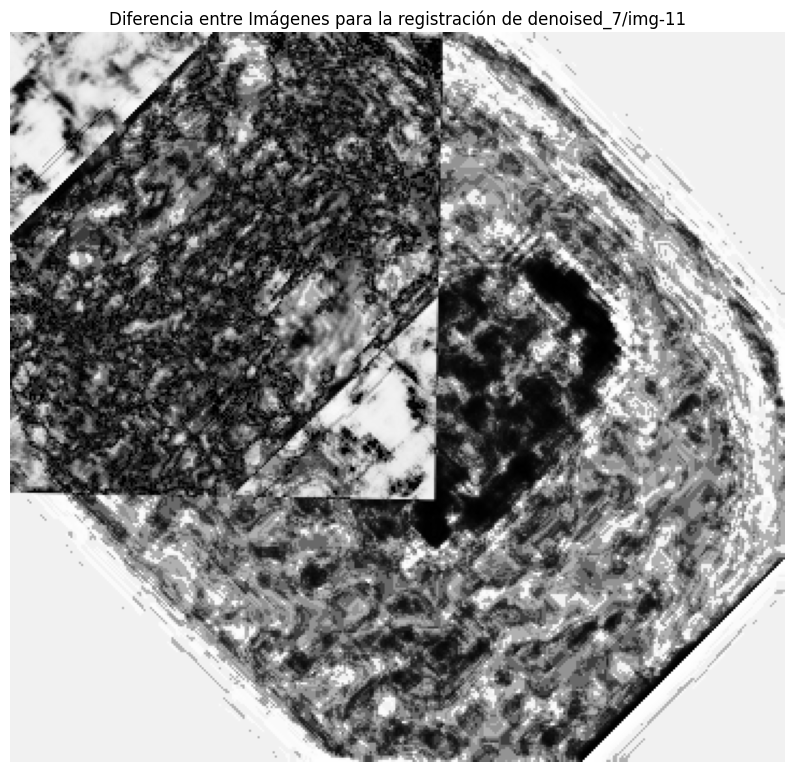

SSIM: 0.0070
MSE: 108.9602
PSNR: 63.9154


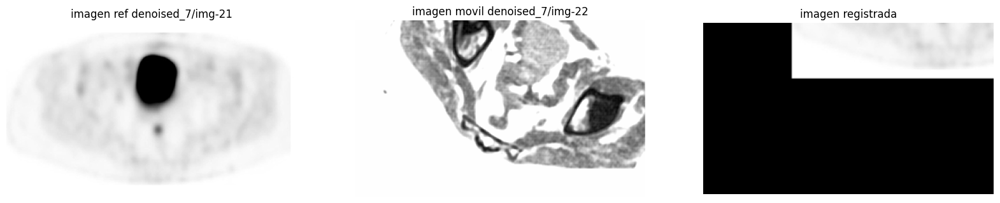

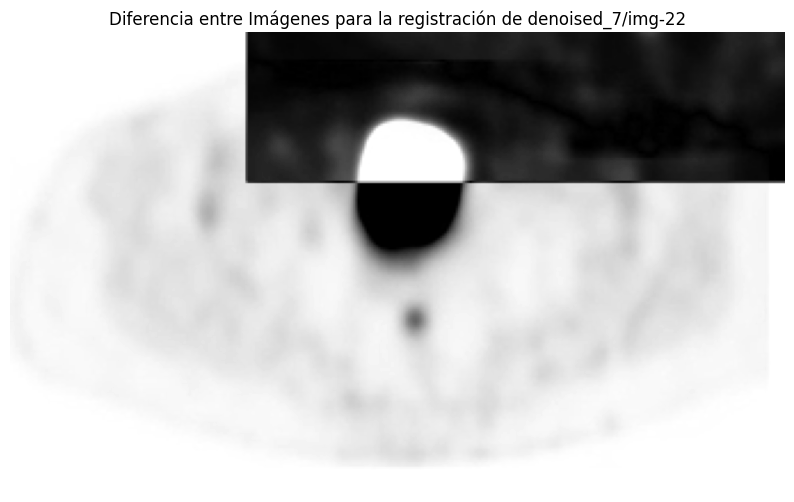

SSIM: 0.1494
MSE: 83.2648
PSNR: 66.6050


In [4]:
for im1, im2 in img_pairs:
    reg = Registracion(im1, im2, modo='intensidad')
    reg.registracion_CCN()
    reg.plot_registracion()
    reg.calcular_metricas()

## Registración basada en MI

Información Mutua inicial: 0.142078
differential_evolution step 1: f(x)= -0.19151517646519123
differential_evolution step 2: f(x)= -0.19151517646519123
differential_evolution step 3: f(x)= -0.19151517646519123
differential_evolution step 4: f(x)= -0.19151517646519123
differential_evolution step 5: f(x)= -0.1990918996792883
differential_evolution step 6: f(x)= -0.21478655350862078
differential_evolution step 7: f(x)= -0.21478655350862078
differential_evolution step 8: f(x)= -0.21478655350862078
differential_evolution step 9: f(x)= -0.21755782443109745
differential_evolution step 10: f(x)= -0.21755782443109745
differential_evolution step 11: f(x)= -0.21755782443109745
differential_evolution step 12: f(x)= -0.21755782443109745
differential_evolution step 13: f(x)= -0.21755782443109745
differential_evolution step 14: f(x)= -0.21755782443109745
differential_evolution step 15: f(x)= -0.21755782443109745
differential_evolution step 16: f(x)= -0.21755782443109745
differential_evolution step 17

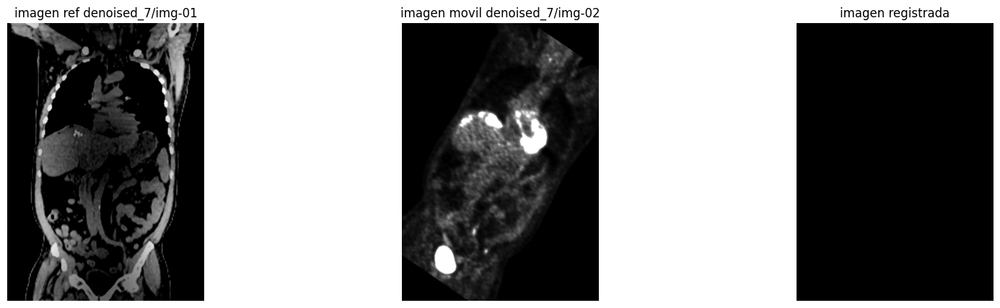

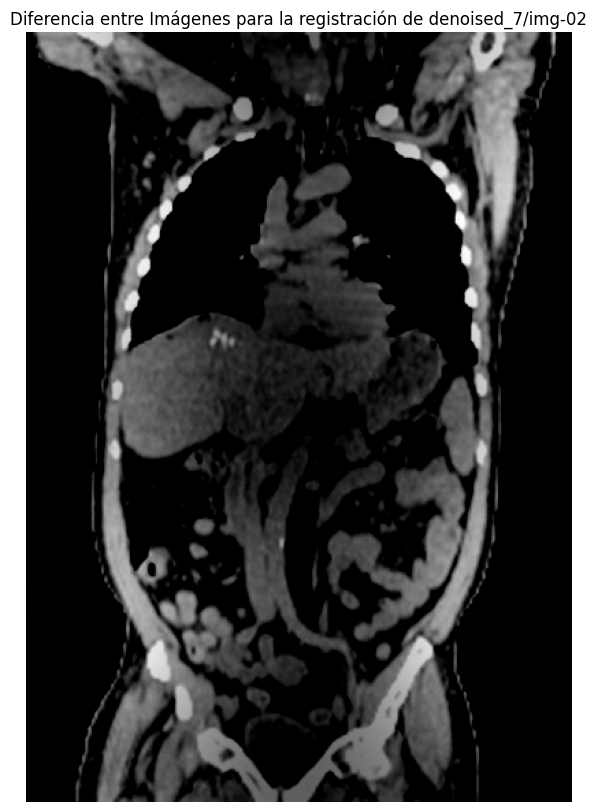

SSIM: 0.4344
MSE: 46.8815
PSNR: 72.3490
Información Mutua inicial: 0.066196
differential_evolution step 1: f(x)= -0.30314878799086303
differential_evolution step 2: f(x)= -0.3068154936655228
differential_evolution step 3: f(x)= -0.3091042990871299
differential_evolution step 4: f(x)= -0.3194570830126011
differential_evolution step 5: f(x)= -0.3194570830126011
differential_evolution step 6: f(x)= -0.3194570830126011
differential_evolution step 7: f(x)= -0.3307712697331574
differential_evolution step 8: f(x)= -0.33926456138152294
differential_evolution step 9: f(x)= -0.33926456138152294
differential_evolution step 10: f(x)= -0.33926456138152294
differential_evolution step 11: f(x)= -0.35118831143208884
differential_evolution step 12: f(x)= -0.35154757930182357
differential_evolution step 13: f(x)= -0.3559361112163615
differential_evolution step 14: f(x)= -0.3559361112163615
differential_evolution step 15: f(x)= -0.3559361112163615
differential_evolution step 16: f(x)= -0.3559361112163615

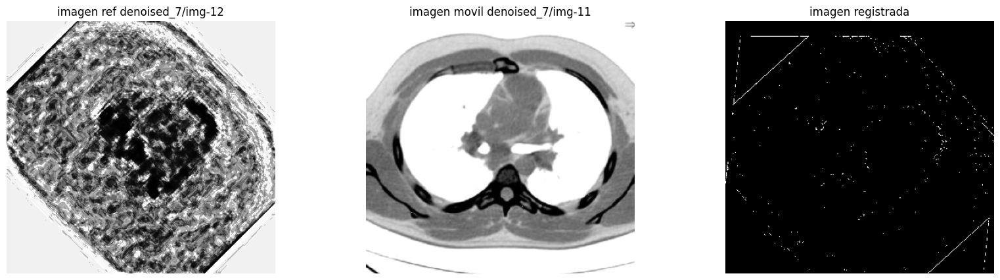

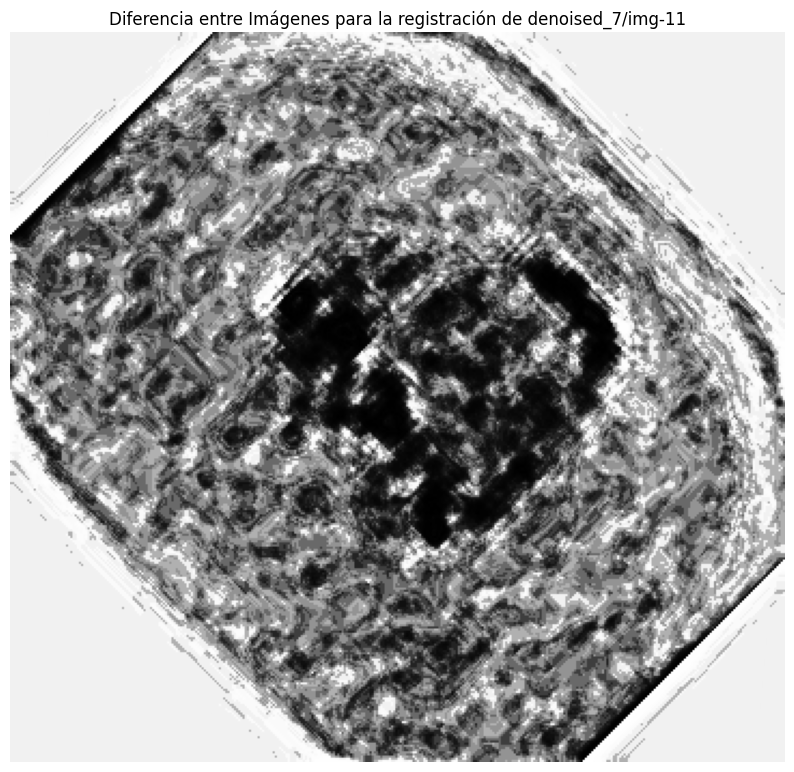

SSIM: 0.0047
MSE: 101.3142
PSNR: 64.6430
Información Mutua inicial: 0.216942
differential_evolution step 1: f(x)= -0.38516608237734723
differential_evolution step 2: f(x)= -0.40514041841080206
differential_evolution step 3: f(x)= -0.40514041841080206
differential_evolution step 4: f(x)= -0.40514041841080206
differential_evolution step 5: f(x)= -0.41040878387391033
differential_evolution step 6: f(x)= -0.41040878387391033
differential_evolution step 7: f(x)= -0.41040878387391033
differential_evolution step 8: f(x)= -0.41040878387391033
differential_evolution step 9: f(x)= -0.41040878387391033
differential_evolution step 10: f(x)= -0.437730394757186
differential_evolution step 11: f(x)= -0.44971528427609286
differential_evolution step 12: f(x)= -0.4550058453063446
differential_evolution step 13: f(x)= -0.4550058453063446
differential_evolution step 14: f(x)= -0.4550058453063446
differential_evolution step 15: f(x)= -0.4717644141460392
differential_evolution step 16: f(x)= -0.471764414146

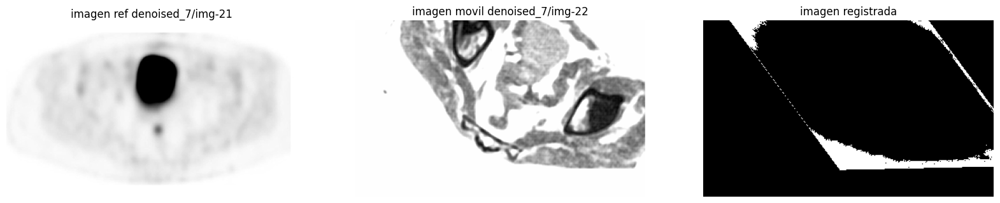

OpenCV(4.10.0) /io/opencv/modules/core/src/arithm.cpp:658: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'



<Figure size 1000x1000 with 0 Axes>

In [5]:
for im1, im2 in img_pairs:
    try:
        reg = Registracion(im1, im2, modo='intensidad')
        reg.registracion_IM()
        reg.plot_registracion()
        reg.calcular_metricas()
    except Exception as e:
        print(e)
        continue

## Conclusiones

A pesar de mis mayores intentos, no hubo manera de registrar adecuadamente ninguna imagen con ninguno de los métodos sugeridos. Particularmente, la información mutua ni siquiera logró ejecutarse adecuadamente sin binarizar las imágenes. Evidentemente, el trabajo previo de reducción de ruido no fue suficiente.